## Importamos librerias necesarias para iniciar EDA

In [2]:
import pandas as pd
import numpy as np
import warnings
import re
import json
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from datetime import datetime
from IPython.display import display
# Text
import nltk
nltk.download('punkt')
nltk.download('stopwords')
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator


warnings.filterwarnings('ignore')#to filter all the warnings
pd.set_option('float_format', '{:.4f}'.format)# to keep the float values short

[nltk_data] Error loading punkt: <urlopen error [Errno -3] Temporary
[nltk_data]     failure in name resolution>
[nltk_data] Error loading stopwords: <urlopen error [Errno -3]
[nltk_data]     Temporary failure in name resolution>


## Carga del dataset preprocesado

In [3]:
df = pd.read_csv('../data/preprocessed/video_cln.csv')
df['trending_date'] = pd.to_datetime(df['trending_date'])
df['publish_time'] = pd.to_datetime(df['publish_time'])
df['category_name']= df['category_name'].astype('category')
df.drop_duplicates()
df.head(3)

,video_id,trending_date,category_id,publish_time,views,likes,dislikes,comment_count,category_name,tags,video_title,channel_title,description
0,2kyS6SvSYSE,2017-11-14,22,2017-11-13 17:13:01,748374,57527,2966,15954,People & Blogs,shantell martin,we want to talk about our marriage,caseyneistat,shantell s channel https www youtube com shant...
1,1ZAPwfrtAFY,2017-11-14,24,2017-11-13 07:30:00,2418783,97185,6146,12703,Entertainment,last week tonight trump presidency last week t...,the trump presidency last week tonight with jo...,lastweektonight,one year after the presidential election john ...
2,5qpjK5DgCt4,2017-11-14,23,2017-11-12 19:05:24,3191434,146033,5339,8181,Comedy,racist superman rudy mancuso king bach racist ...,racist superman rudy mancuso king bach lele pons,rudy mancuso,watch my previous video n nsubscribe https www...


### Descripcion del dataset preprocesado

* video_id------------------------- ID de cada video `(string)`
* published_time----------------------- Fecha _(año-mes-dia)_ de publicacion del video `(datetime)`
* category_id------------------------ Id de cada categoria por video `(Int)`
* trending_date---------------------- Fecha _(año-mes-dia hora:min:seg)_ en el que el video se hizo viral `(datetime)`
* view_count------------------------- Cantidad de visitas del video `(Int)`
* likes------------------------------ Cantidad del likes del video `(Int)`
* dislikes--------------------------- Cantidad de dislike del video `(Int)`
* comment_count---------------------- Cantidad de comentarios del video `(Int)`
* category_name----------------------- Nombre de la categoria ligada al category_id `(category)`
* description----------------------------- Descripcion por cada video `(string)`
* tags--------------------------------------- Etiquetas sobre el contenido del video `(string)`
* video_title------------------------------ Titulo del video `(string)`
* channel_title-------------------------- Titulo del canal que publico el video `(string)`

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40949 entries, 0 to 40948
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   video_id       40949 non-null  object        
 1   trending_date  40949 non-null  datetime64[ns]
 2   category_id    40949 non-null  int64         
 3   publish_time   40949 non-null  datetime64[ns]
 4   views          40949 non-null  int64         
 5   likes          40949 non-null  int64         
 6   dislikes       40949 non-null  int64         
 7   comment_count  40949 non-null  int64         
 8   category_name  40949 non-null  category      
 9   tags           40949 non-null  object        
 10  video_title    40946 non-null  object        
 11  channel_title  40949 non-null  object        
 12  description    40949 non-null  object        
dtypes: category(1), datetime64[ns](2), int64(5), object(5)
memory usage: 3.8+ MB


### 1. ¿Cuáles son las categorías de vídeos que reciben mayores vistas y Likes?

In [5]:
df[df['description'].isna()]

,video_id,trending_date,category_id,publish_time,views,likes,dislikes,comment_count,category_name,tags,video_title,channel_title,description


In [6]:
# ¿Cuantas categorias existen en nuestro dataset?
len(df['category_name'].unique())

16

In [7]:
df_like_dislikes_cat = df.groupby('category_name')[['likes', 'dislikes', 'views']].sum()
df_like_dislikes_cat.sort_values('views', ascending=False)

,likes,dislikes,views
category_name,,,
Music,1416838584,51179008,40132892190
Entertainment,530516491,42987663,20604388195
Film & Animation,165997476,6075148,7284156721
Comedy,216346746,7230391,5117426208
People & Blogs,186615999,10187901,4917191726
Sports,98621211,5133551,4404456673
Howto & Style,162880075,5473899,4078545064
Science & Technology,82532638,4548402,3487756816
Gaming,69038284,9184466,2141218625


In [8]:
fig = px.line(df_like_dislikes_cat, 
              x=df_like_dislikes_cat.index,
              y='views',
              title='Views per category')
fig.show()

<p style='color: green'>Conclusion</p>

* `Music` es la categoria que mas vistas acumula con mas de 40 billones de visitas
* `Entertainment` es la categoria que se acerca mas a music pero esta cuenta con un total de 20B de visitas acumuladas.
* `Film & Animation` obtiene el 3er lugar de esta ranking con mas de 7B de visitas acumuladas en sus videos

In [9]:
df_like_dislikes_cat.sort_values('likes', ascending=False)

,likes,dislikes,views
category_name,,,
Music,1416838584,51179008,40132892190
Entertainment,530516491,42987663,20604388195
Comedy,216346746,7230391,5117426208
People & Blogs,186615999,10187901,4917191726
Film & Animation,165997476,6075148,7284156721
Howto & Style,162880075,5473899,4078545064
Sports,98621211,5133551,4404456673
Science & Technology,82532638,4548402,3487756816
Gaming,69038284,9184466,2141218625


In [10]:
plt.rcParams["figure.figsize"] = (12,8)
fig = px.line(df_like_dislikes_cat, 
              x=df_like_dislikes_cat.index,
              y='likes',
              title='Likes per category')
fig.show()

<p style='color: green'>Conclusion</p>

* `Music` es la categoria que mas likes acumula con mas de 1.4 billones de likes
* `Entertainment` es la categoria que se acerca mas a music pero esta cuenta con mas de 530 millones de likes acumulados.
* `Comedy` obtiene el 3er lugar de esta ranking con mas de 216 millones de likes acumulados en sus videos

### 2. ¿Es posible encontrar agrupaciones o clasificaciones de videos?

In [11]:
df.sample(3)

,video_id,trending_date,category_id,publish_time,views,likes,dislikes,comment_count,category_name,tags,video_title,channel_title,description
33776,-66xHRJSPxs,2018-05-10,24,2018-05-07 21:00:00,1054918,25468,775,3323,Entertainment,what would my kid do toys parents kids can par...,can parents guess what their kid does with 100...,fbe,what do kids do when they get 100 dollars to b...
37917,oSEeK9yDNQI,2018-05-30,20,2018-05-10 13:19:23,14966797,267199,23960,20333,Gaming,clash royale clash royale game supercell super...,clash royale meet the rascals new card,clash royale,rascals what have they done now ... new card o...
40117,M79o2UejYKo,2018-06-10,26,2018-05-20 16:00:01,2763416,101597,2308,10506,Howto & Style,diy do it yourself how to laurdiy lauren riihi...,dollar store diy challenge,laurdiy,click to join the prettylittlelaurs fam merch ...


In [12]:
df['trending_month'] = df['trending_date'].dt.month_name()
df['trending_year'] = df['trending_date'].dt.year

In [38]:
categories = df['category_name'].unique()
def plot_per_category(categories, df):
    for category in categories:
        df.drop_duplicates(subset=['video_id'], keep='last', inplace = True)
        print(category)
        df1 = df[df['category_name'] == category]
        df1 = df1.groupby('trending_month')[['views', 'likes', 'dislikes']].sum()
        best_month = df1['views'].idxmax()
        print("Best month for plublish {} video is {}".format(category, best_month))
        fig = px.line(df1, x=df1.index, y='views', title=category)
        fig.show()

In [39]:
plot_per_category(categories, df)

Sports
Best month for plublish Sports video is March


Film & Animation
Best month for plublish Film & Animation video is June


News & Politics
Best month for plublish News & Politics video is February


Entertainment
Best month for plublish Entertainment video is December


Science & Technology
Best month for plublish Science & Technology video is February


Comedy
Best month for plublish Comedy video is January


Music
Best month for plublish Music video is May


Howto & Style
Best month for plublish Howto & Style video is December


People & Blogs
Best month for plublish People & Blogs video is February


Education
Best month for plublish Education video is January


Autos & Vehicles
Best month for plublish Autos & Vehicles video is February


Pets & Animals
Best month for plublish Pets & Animals video is January


Gaming
Best month for plublish Gaming video is June


Travel & Events
Best month for plublish Travel & Events video is February


Nonprofits & Activism
Best month for plublish Nonprofits & Activism video is February


Shows
Best month for plublish Shows video is April


De las graficas anteriores, separadas por categorias, encontramos que:
* No existe una formula secreta para conocer la repercusion de la fecha en el video que publiquemos
* Sin embargo, es posible notar como algunas categorias ven potenciadas su numero de visualizaciones dependiendo la epoca del año, por ejemplo:
    * `Diciembre`: Decoracion para el hogar o estilos y nuevas tendencias de moda, igualmente para la industria del entretenimiento
    * `January`: Para todo lo relacionado con educacion y el regreso a las escuelas
    *  `June`: Para la industria del gaming al igual que del cine

### 3. ¿Cuál es la combinación de características o atributos más importantes que hacen de un video tendencia?

In [15]:
stopwords = set(STOPWORDS)
stopwords.update(['follow', 'twitter', 'social', 'instagram', 'subscribe', 'snapchat', 'youtube', 'videos', 'video'\
                  ,'channel', 'share', 'facebook', 'comment', 'like', 'take', 'go', 'got', 'back',\
                  'much', 'made', 'keep', 'watch','none', 'check', 'will', 'make', 'https',\
                  'nfollow', 'ntwitter', 'nsocial', 'ninstagram', 'nhttp', 'nfacebook',\
                  'n', 'nhttps', 'tumblr', 'e', 'youtube', 'netflix', 'bit', 'ly',\
                  'nwatch', 'goo', 'gl', 'amzn', 'nnbc', 'nbc', 'youtu', 'nlike',\
                  'google', 'plus', 'nclick', 'nbctv', 'c', 's', 'nsubscribe', 'iphone',\
                  'pl7u4lwxq3wfi_7pgx0c-vtiwleu0s4v34', '2018', 'nlearn'])

def generate_wordcloud(text, stop_words):
    wordcloud = WordCloud(stopwords=stop_words,max_font_size=50, max_words=150, background_color="white").generate(text)
    plt.figure()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()


        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
        10 palabras más frecuentes en People & Blogs para los 50 videos mas vistos
        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
    


'People & Blogs'

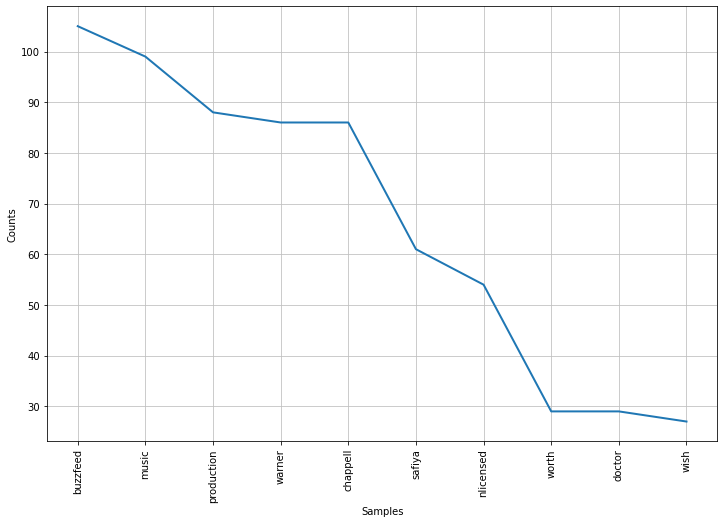

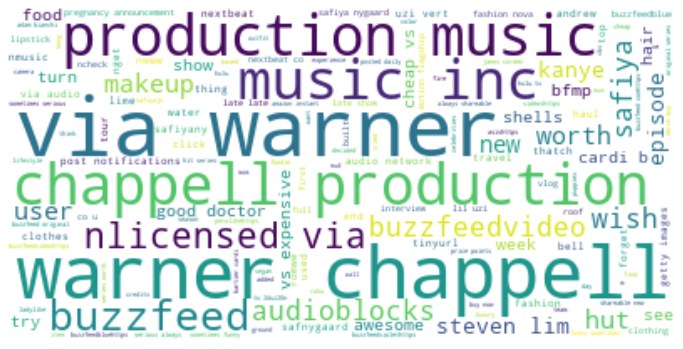


        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
        10 palabras más frecuentes en Entertainment para los 50 videos mas vistos
        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
    


'Entertainment'

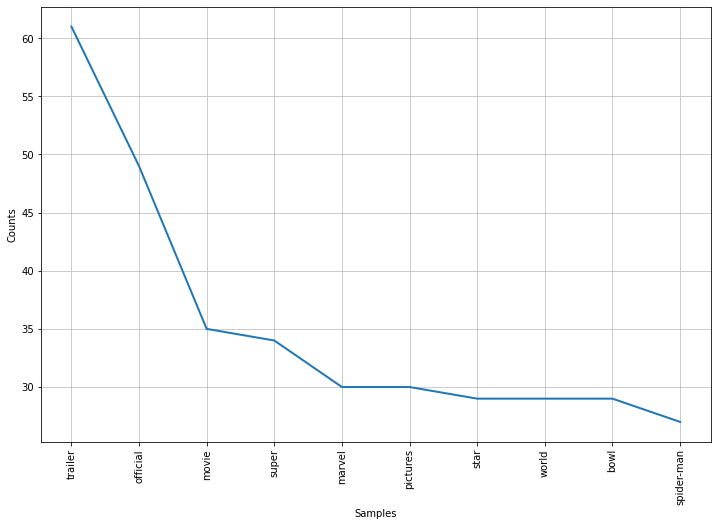

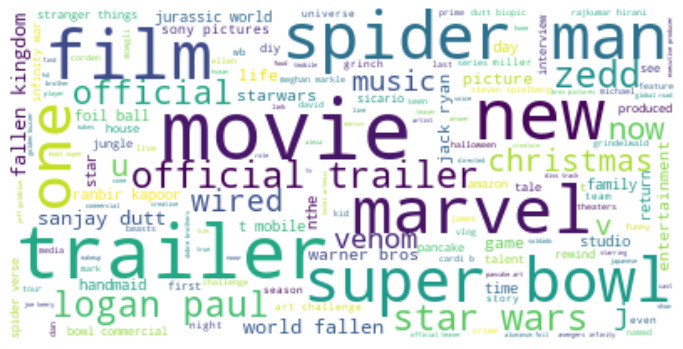


        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
        10 palabras más frecuentes en Comedy para los 50 videos mas vistos
        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
    


'Comedy'

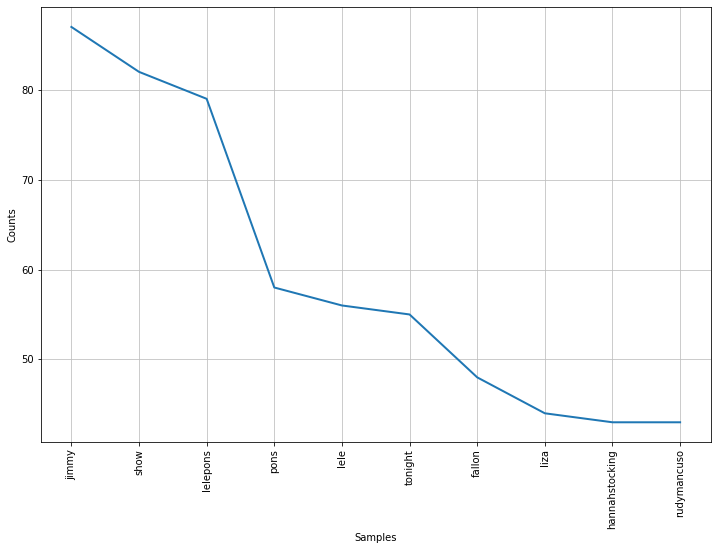

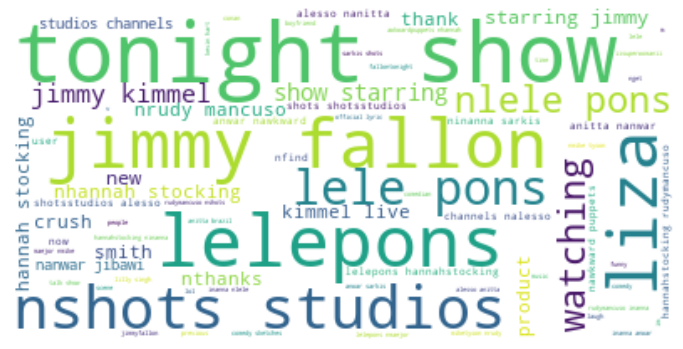


        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
        10 palabras más frecuentes en Science & Technology para los 50 videos mas vistos
        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
    


'Science & Technology'

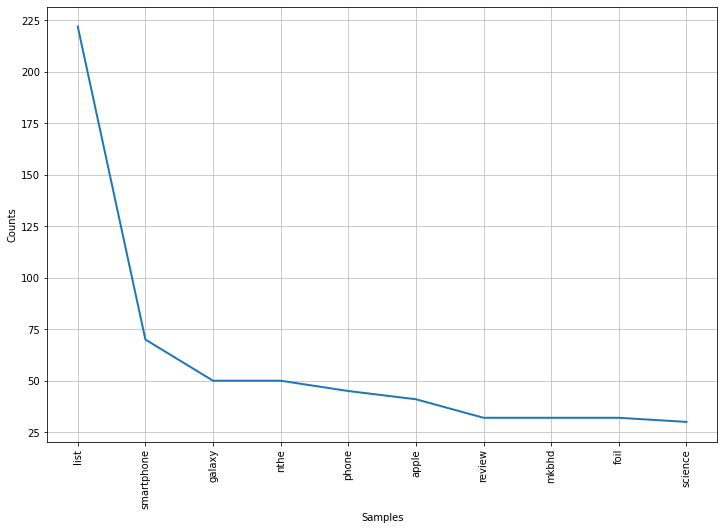

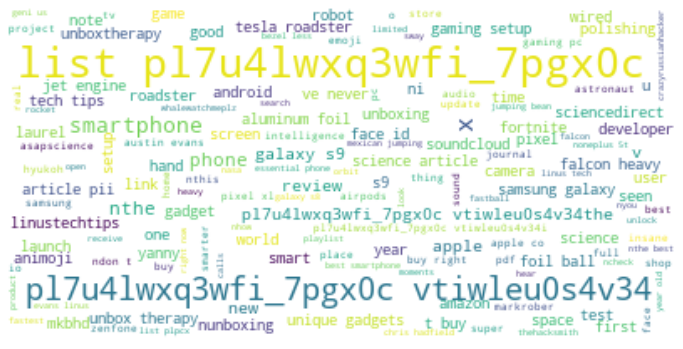


        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
        10 palabras más frecuentes en Film & Animation para los 50 videos mas vistos
        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
    


'Film & Animation'

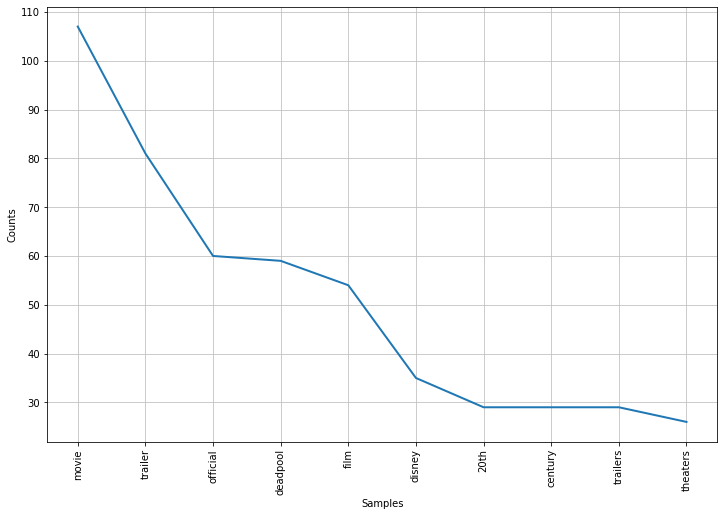

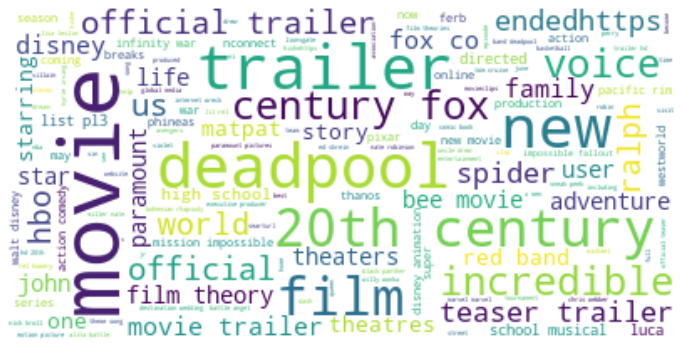


        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
        10 palabras más frecuentes en News & Politics para los 50 videos mas vistos
        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
    


'News & Politics'

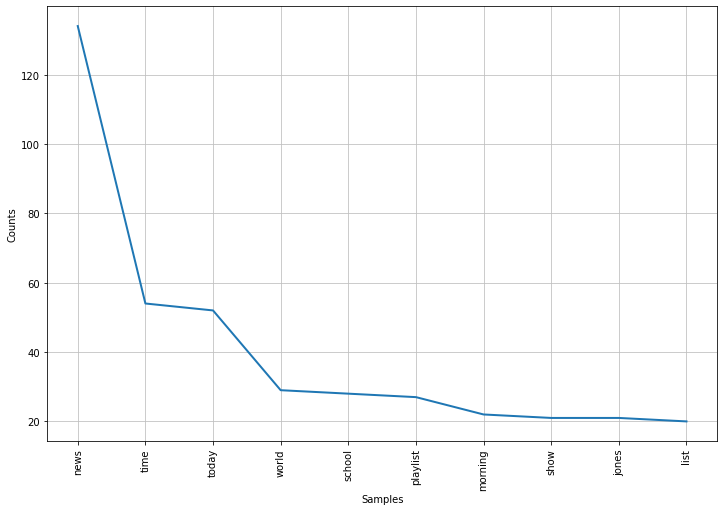

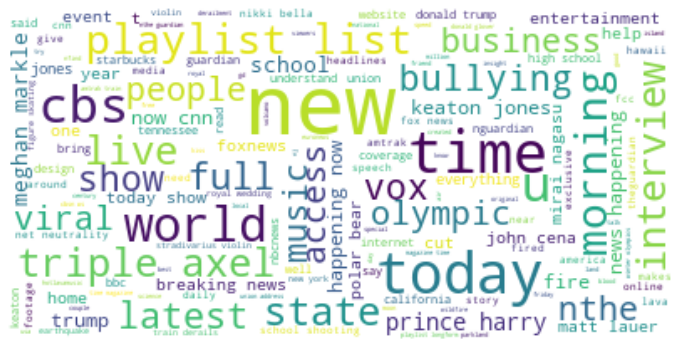


        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
        10 palabras más frecuentes en Sports para los 50 videos mas vistos
        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
    


'Sports'

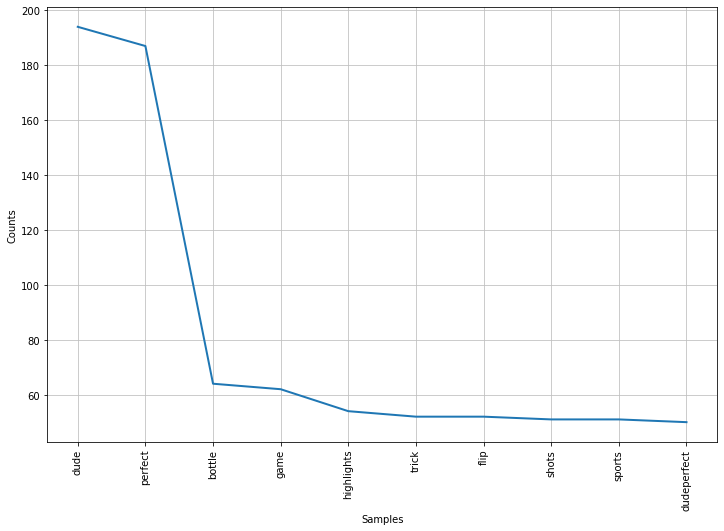

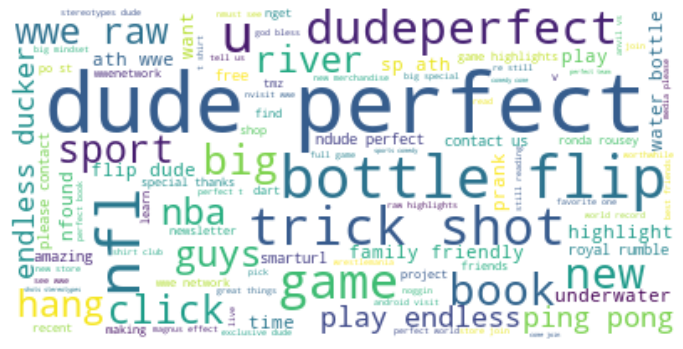


        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
        10 palabras más frecuentes en Music para los 50 videos mas vistos
        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
    


'Music'

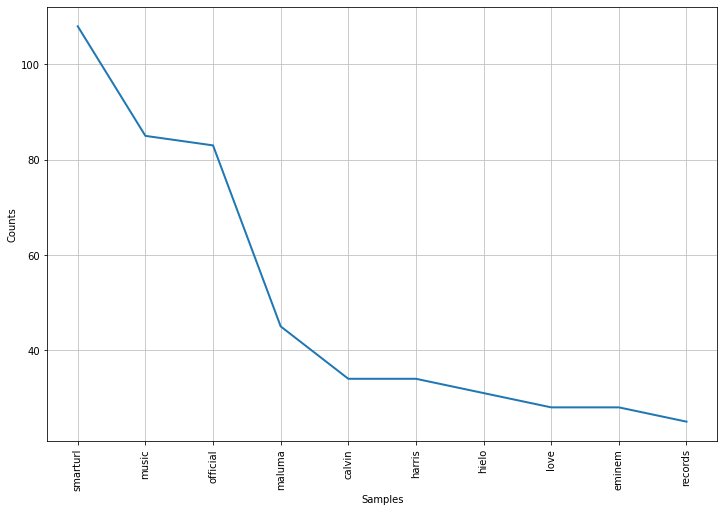

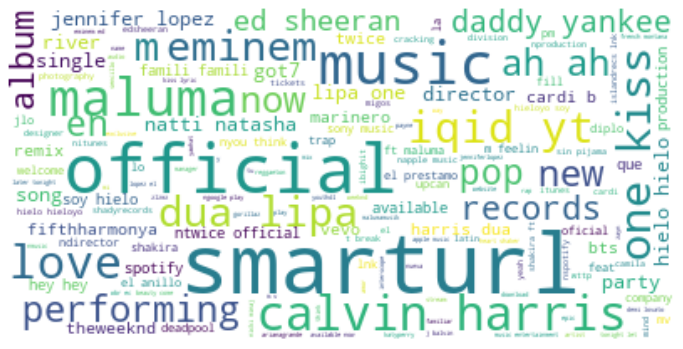


        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
        10 palabras más frecuentes en Pets & Animals para los 50 videos mas vistos
        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
    


'Pets & Animals'

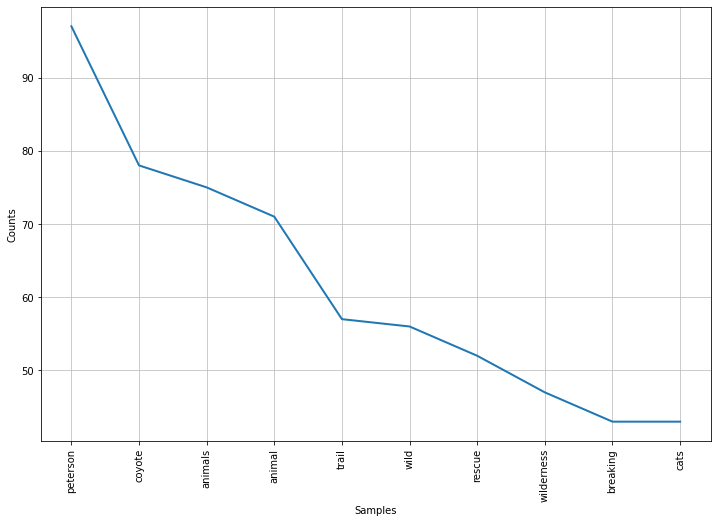

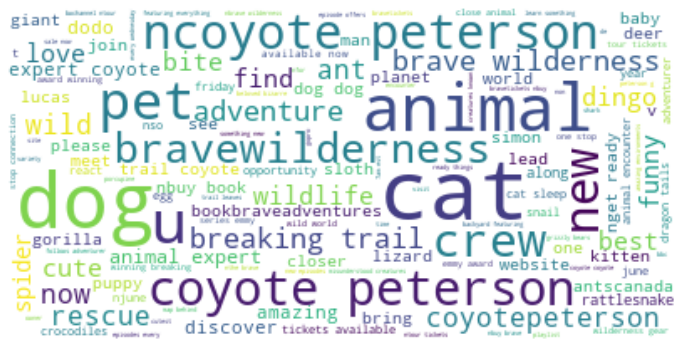


        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
        10 palabras más frecuentes en Education para los 50 videos mas vistos
        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
    


'Education'

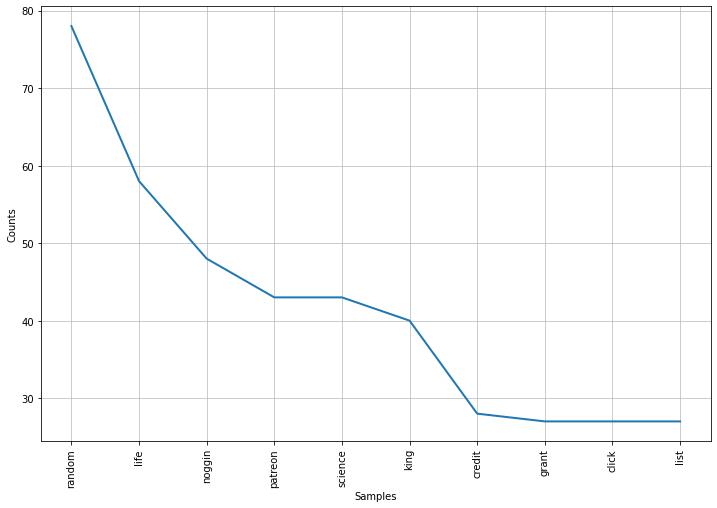

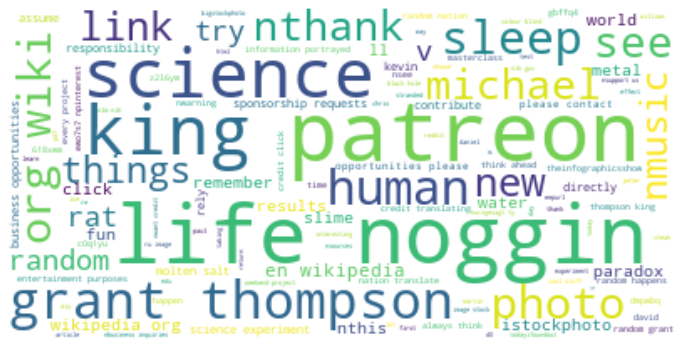


        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
        10 palabras más frecuentes en Howto & Style para los 50 videos mas vistos
        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
    


'Howto & Style'

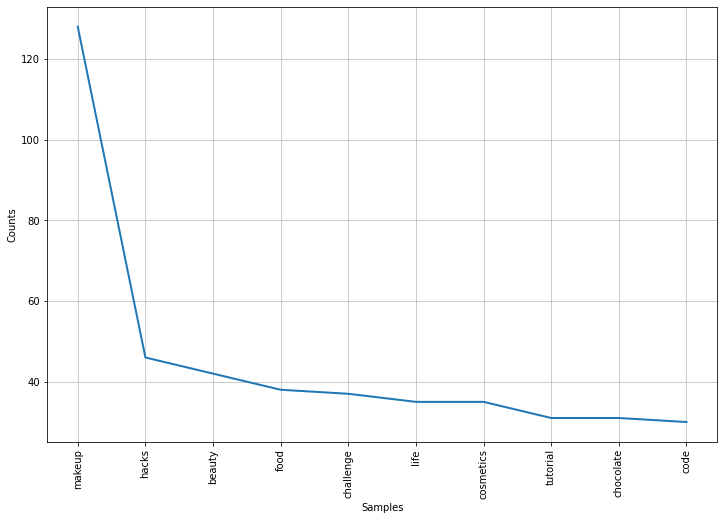

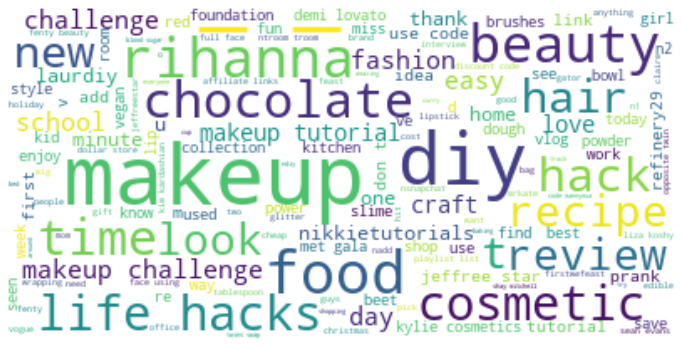


        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
        10 palabras más frecuentes en Autos & Vehicles para los 50 videos mas vistos
        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
    


'Autos & Vehicles'

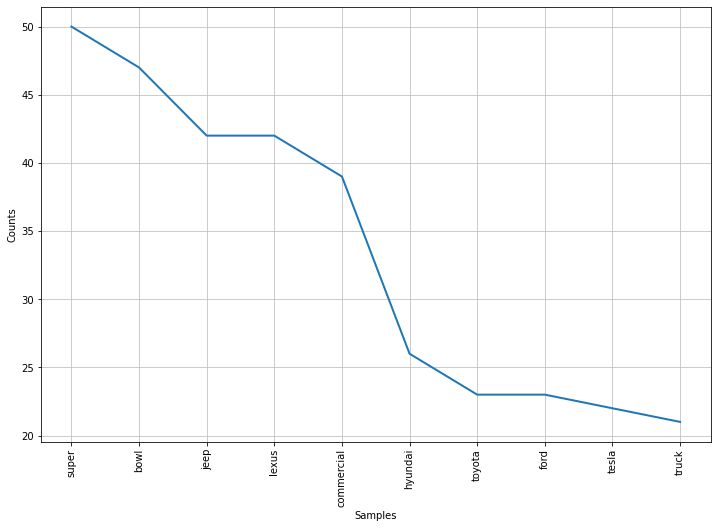

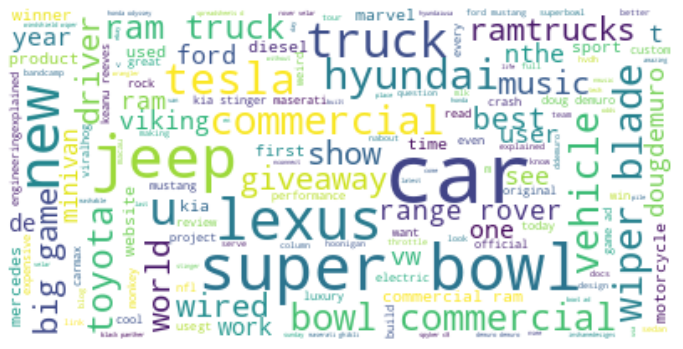


        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
        10 palabras más frecuentes en Travel & Events para los 50 videos mas vistos
        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
    


'Travel & Events'

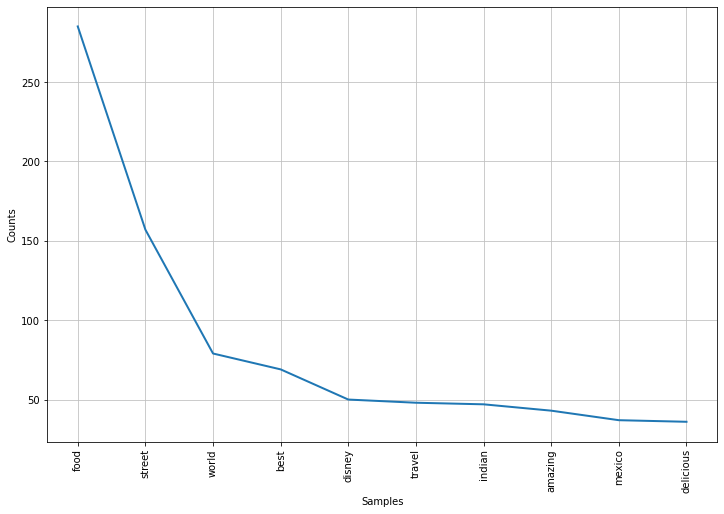

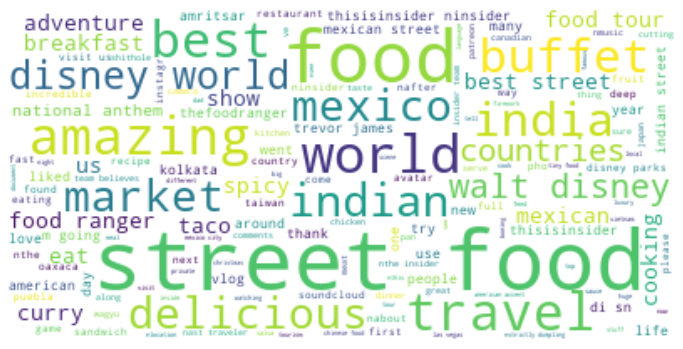


        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
        10 palabras más frecuentes en Gaming para los 50 videos mas vistos
        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
    


'Gaming'

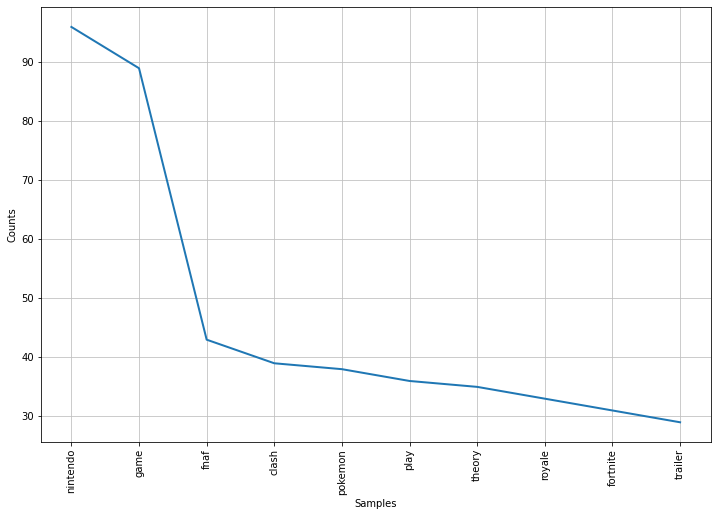

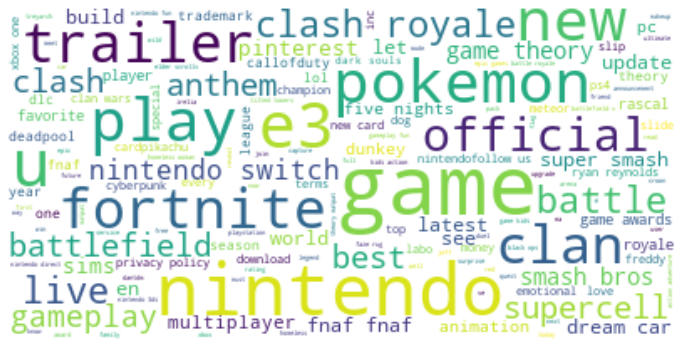


        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
        10 palabras más frecuentes en Nonprofits & Activism para los 50 videos mas vistos
        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
    


'Nonprofits & Activism'

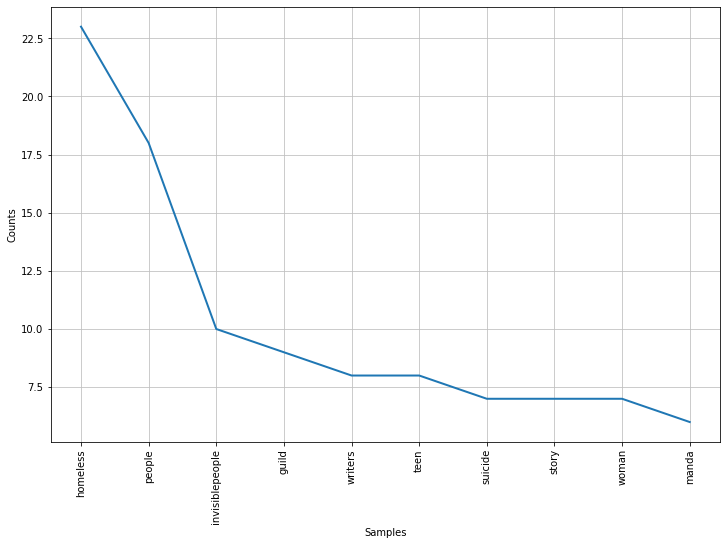

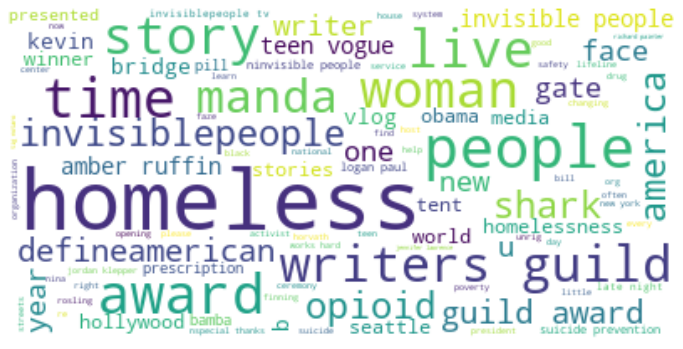


        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
        10 palabras más frecuentes en Shows para los 50 videos mas vistos
        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
    


'Shows'

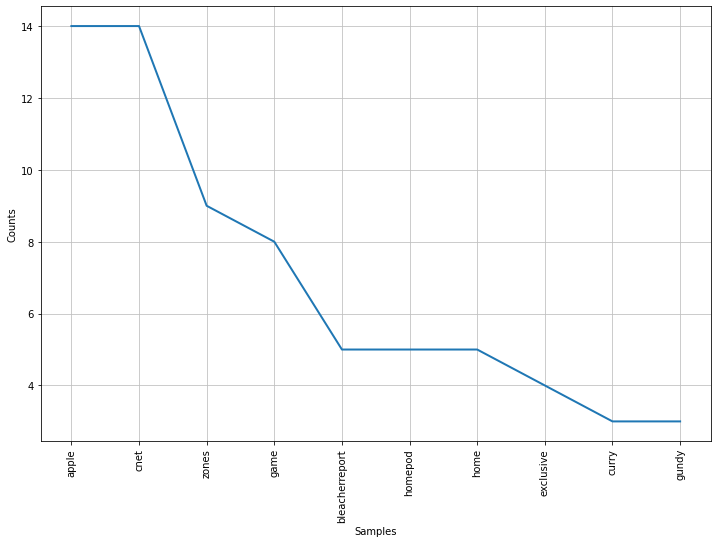

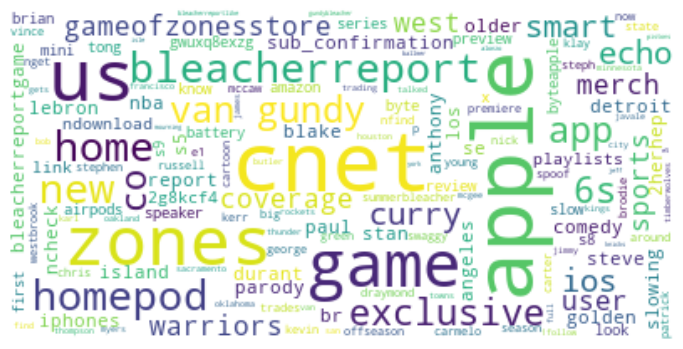

In [16]:
for category in categories:
    df_top_for_category = df[df['category_name'] == category].groupby('video_id', as_index=False)\
        [['description', 'video_title', 'tags', 'views']].max().sort_values(by='views', ascending=False)[:50]
    description = df_top_for_category['description'].values
    video_title = df_top_for_category['video_title'].values
    tags = df_top_for_category['tags'].values

    text = description + video_title + tags
    
    try:
        text = ' '.join(text)
    except Exception:
        text = ' '
    
    tokenlist = nltk.word_tokenize(text, 'english')
    fdist = nltk.FreqDist([word for word in tokenlist if len(word) > 3 if word not in stopwords])
    most_common = fdist.most_common(10)
    print(f"""
        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
        10 palabras más frecuentes en {category} para los 50 videos mas vistos
        ::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
    """)
    display(category)
    fdist.plot(10)
    generate_wordcloud(text, stopwords)

### 4. ¿La temporada o fecha en el que el video es publicado tiene alguna influencia? 

In [17]:
df_trending = pd.DataFrame()
df_trending['video_id'] = df['video_id']
df_trending['published_date'] = df['publish_time']
df_trending['trending_date'] = df['trending_date']
df_trending['views'] = df['views']

In [18]:
total_day_trending = df_trending.groupby('video_id', as_index=False)['trending_date'].count()
total_day_trending.rename({'trending_date':'total_trending_days'}, axis=1, inplace=True)


In [19]:
df_trending = pd.merge(df_trending, total_day_trending, how='left', on='video_id')


In [20]:
df_trending_max = df_trending.groupby('video_id', as_index=False).max()
df_trending_max['publish_year'] = df_trending_max['published_date'].dt.year
df_trending_max['publish_month'] = df_trending_max['published_date'].dt.month_name()
df_trending_max['publish_day'] = df_trending_max['published_date'].dt.day
df_trending_max.groupby('publish_year')['views'].count()

publish_year
2006       1
2008       3
2009       5
2010       6
2011       8
2012       8
2013      13
2014       7
2015      10
2016       9
2017    2152
2018    4129
Name: views, dtype: int64

In [41]:
def plot_per_month(df, year, month=None):
    df_temp = df[df['publish_year'] == year]
    if month:
        df_temp = df_temp[df['publish_month'] == month]
        fig = px.bar(data_frame=df_temp, 
        x='publish_day' ,y='total_trending_days', title='Trending days per Month in {}/{}'.format(month, year))
        display("La mediana de dias en tendencia en {} es {}".format(month, np.median(df_temp['total_trending_days'])))
        fig.show()
        fig2 = px.bar(data_frame=df_temp, 
        x='publish_day', y='views', title='Views per day in {}/{}'.format(month, year))
        display("La mediana de views en {} es {}".format(month, np.median(df_temp['views'])))
        fig2.show()
        return 'Done!'
    fig = px.bar(df_temp, 'publish_month', 'views', title='Views per Month in {}'.format(year))
    fig.show()
    fig2 = px.bar(df_temp, 'publish_month', 'total_trending_days', title='Total trending days per month in {}'.format(year))
    fig2.show()

In [22]:
plot_per_month(df_trending_max, 2018)

In [42]:
plot_per_month(df_trending_max, 2018, 'May')

'La mediana de dias en tendencia en May es 12.0'

'La mediana de views en May es 1562000.0'

'Done!'

Nota: Se toma en cuenta el año `2018` debido a que corresponde al año con mayor cantidad de registros

### Conclusiones:
* Para el año 2018 `May` fue un año idoneo para publicar videos, ya que en este mes se concentro la mayor cantidad de videos que lograron ser tedencias:
 * Obtuvieron una mediana de 12 dias siendo tendencia
 * Obtuvieron una mediana de 1.5 millones de visualizaciones durante el mes
* En general a excepcion de `June` durante el 2018 todos los videos que conforman el dataset analizado lograron conseguir ser tendencia en por lo menos **2 dias** acumulando mas de **5000 videos** publicados como minimo en los otros meses

### 5. ¿Es posible predecir cuantos likes o visitas tendrá un video? Si es así, crea un modelo que lo compruebe.

In [24]:
print(df.shape)
df.head(1)

(40949, 15)


,video_id,trending_date,category_id,publish_time,views,likes,dislikes,comment_count,category_name,tags,video_title,channel_title,description,trending_month,trending_year
0,2kyS6SvSYSE,2017-11-14,22,2017-11-13 17:13:01,748374,57527,2966,15954,People & Blogs,shantell martin,we want to talk about our marriage,caseyneistat,shantell s channel https www youtube com shant...,November,2017


Generaremos un nuevo `DataFrame` que contenga información de valor para alimentar nuestro modelo, algunas columnas que contendrá son:
* total_trending_days
* likes
* category_id
* dislikes
* total_views
* published_minute
* published_hour
* published_day
* published_week
* published_month
* published_year

In [25]:
print(df_trending.shape)
df_trending.head(1)

(40949, 5)


,video_id,published_date,trending_date,views,total_trending_days
0,2kyS6SvSYSE,2017-11-13 17:13:01,2017-11-14,748374,7


In [26]:
df2 = pd.merge(df, df_trending_max[['video_id', 'total_trending_days']], how='right',
                on='video_id')
df2.shape

(40949, 16)

Comprobamos el resultado del `merge` sobre los dos `DataFrame`

In [27]:
df2[df2['video_id'] == '-0CMnp02rNY']
#df2.head(1)

,video_id,trending_date,category_id,publish_time,views,likes,dislikes,comment_count,category_name,tags,video_title,channel_title,description,trending_month,trending_year,total_trending_days
0,-0CMnp02rNY,2018-06-06,24,2018-06-04 13:00:00,475965,6531,172,271,Entertainment,ellen ellen degeneres the ellen show ellentube...,mindy kaling s daughter had the perfect reacti...,theellenshow,ocean s 8 star mindy kaling dished on bringing...,June,2018,6
1,-0CMnp02rNY,2018-06-07,24,2018-06-04 13:00:00,605506,7848,232,354,Entertainment,ellen ellen degeneres the ellen show ellentube...,mindy kaling s daughter had the perfect reacti...,theellenshow,ocean s 8 star mindy kaling dished on bringing...,June,2018,6
2,-0CMnp02rNY,2018-06-08,24,2018-06-04 13:00:00,705986,8930,277,371,Entertainment,ellen ellen degeneres the ellen show ellentube...,mindy kaling s daughter had the perfect reacti...,theellenshow,ocean s 8 star mindy kaling dished on bringing...,June,2018,6
3,-0CMnp02rNY,2018-06-09,24,2018-06-04 13:00:00,754273,9395,303,383,Entertainment,ellen ellen degeneres the ellen show ellentube...,mindy kaling s daughter had the perfect reacti...,theellenshow,ocean s 8 star mindy kaling dished on bringing...,June,2018,6
4,-0CMnp02rNY,2018-06-10,24,2018-06-04 13:00:00,792613,9720,330,413,Entertainment,ellen ellen degeneres the ellen show ellentube...,mindy kaling s daughter had the perfect reacti...,theellenshow,ocean s 8 star mindy kaling dished on bringing...,June,2018,6
5,-0CMnp02rNY,2018-06-11,24,2018-06-04 13:00:00,800359,9773,332,423,Entertainment,ellen ellen degeneres the ellen show ellentube...,mindy kaling s daughter had the perfect reacti...,theellenshow,ocean s 8 star mindy kaling dished on bringing...,June,2018,6


In [28]:
drop_columns_no_numericals = ['video_id', 'tags', 'video_title', 'channel_title',
       'description', 'trending_month']

In [29]:
df2.drop(drop_columns_no_numericals, axis=1, inplace=True)

In [30]:
df2['published_year'] = df2['publish_time'].dt.year
df2['published_month'] = df2['publish_time'].dt.month
df2['published_week'] = df2['publish_time'].dt.week
df2['published_day'] = df2['publish_time'].dt.day
df2['published_hour'] = df2['publish_time'].dt.hour
df2['published_minute'] = df2['publish_time'].dt.minute
df2.head(2)


,trending_date,category_id,publish_time,views,likes,dislikes,comment_count,category_name,trending_year,total_trending_days,published_year,published_month,published_week,published_day,published_hour,published_minute
0,2018-06-06,24,2018-06-04 13:00:00,475965,6531,172,271,Entertainment,2018,6,2018,6,23,4,13,0
1,2018-06-07,24,2018-06-04 13:00:00,605506,7848,232,354,Entertainment,2018,6,2018,6,23,4,13,0


Eliminamos las columnas tipo `datetime` que ya fueron desempaquetadas

In [31]:
df2.drop(['trending_date', 'publish_time', 'trending_year'], axis=1, inplace=True)
df2.sample(3)

,category_id,views,likes,dislikes,comment_count,category_name,total_trending_days,published_year,published_month,published_week,published_day,published_hour,published_minute
14675,24,56012,6243,106,414,Entertainment,1,2017,11,45,9,19,11
12676,17,4869556,54680,1767,6213,Sports,13,2018,3,13,31,20,49
16562,22,176811,6396,210,505,People & Blogs,7,2018,2,7,18,19,46


Momento de exportar nuestro nuevo `Dataset` para crear nuestro modelo

In [32]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40949 entries, 0 to 40948
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   category_id          40949 non-null  int64   
 1   views                40949 non-null  int64   
 2   likes                40949 non-null  int64   
 3   dislikes             40949 non-null  int64   
 4   comment_count        40949 non-null  int64   
 5   category_name        40949 non-null  category
 6   total_trending_days  40949 non-null  int64   
 7   published_year       40949 non-null  int64   
 8   published_month      40949 non-null  int64   
 9   published_week       40949 non-null  int64   
 10  published_day        40949 non-null  int64   
 11  published_hour       40949 non-null  int64   
 12  published_minute     40949 non-null  int64   
dtypes: category(1), int64(12)
memory usage: 4.1 MB


In [33]:
df2.to_csv('../data/model_data/youtube_num.csv', index=False)